In [1]:
#notes
#gender differences ( understanding them)
#differnt skills by position
#pay differences based on skils(tools, coding ability , languages)
#what opportunities come from higher education
#what did people leave blank the most?


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px

#lets us display more rows and columns than standard jupyter lab.
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_rows', 500)

In [3]:
df = pd.read_csv('kaggle_survey_2020_responses.csv')
df.shape

/tmp/ipykernel_10291/2670214801.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('kaggle_survey_2020_responses.csv')


(20037, 355)

In [4]:
df.describe()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,...,Q35_B_Part_2,Q35_B_Part_3,Q35_B_Part_4,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER
count,20037,20037,20037,20037,19570,19278,19121,15531,4278,7536,...,1178,495,431,3200,558,481,847,520,3083,252
unique,5168,12,6,56,8,14,8,2,2,2,...,2,2,2,2,2,2,2,2,2,2
top,565,25-29,Man,India,Master’s degree,Student,3-5 years,Python,R,SQL,...,Weights & Biases,Comet.ml,Sacred + Omniboard,TensorBoard,Guild.ai,Polyaxon,Trains,Domino Model Monitor,None,Other
freq,34,4011,15789,5851,7859,5171,4546,15530,4277,7535,...,1177,494,430,3199,557,480,846,519,3082,251


In [5]:
df.head()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,...,Q35_B_Part_2,Q35_B_Part_3,Q35_B_Part_4,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education ...,Select the title most similar to your current ...,For how many years have you been writing code ...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,What programming languages do you use on a reg...,...,"In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor...","In the next 2 years, do you hope to become mor..."
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,TensorBoard,NaN,NaN,NaN,NaN,NaN,NaN
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,NaN,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df1 = df.iloc[1:,:]#removes the top row of the dataset , we will not be needing that row for the analysis
df1.head()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,...,Q35_B_Part_2,Q35_B_Part_3,Q35_B_Part_4,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,TensorBoard,NaN,NaN,NaN,NaN,NaN,NaN
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,NaN,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,78,30-34,Man,Japan,Master’s degree,Software Engineer,3-5 years,Python,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
#get percentage of null values in each question 
df1.isnull().sum()/df.shape[0]

Time from Start to Finish (seconds)    0.000000
Q1                                     0.000000
Q2                                     0.000000
Q3                                     0.000000
Q4                                     0.023307
Q5                                     0.037880
Q6                                     0.045715
Q7_Part_1                              0.224884
Q7_Part_2                              0.786495
Q7_Part_3                              0.623896
Q7_Part_4                              0.834506
Q7_Part_5                              0.808953
Q7_Part_6                              0.831911
Q7_Part_7                              0.850477
Q7_Part_8                              0.986874
Q7_Part_9                              0.990068
Q7_Part_10                             0.911314
Q7_Part_11                             0.889305
Q7_Part_12                             0.989669
Q7_OTHER                               0.902880
Q8                                     0

In [8]:
#wanted to make it easy to run analysis on individual questions if i wanted to , so for that i put all the questions in a dictionary where one key is the Question number and the value is a dataframe with parts of the question.
#I could now pull data regarding a question individualy from the dictionary rather than filtering every time

Questions  = {} # dictionary for questions
qnums = list(dict.fromkeys(i.split('_')[0] for i in df1.columns))
qnums

['Time from Start to Finish (seconds)',
 'Q1',
 'Q2',
 'Q3',
 'Q4',
 'Q5',
 'Q6',
 'Q7',
 'Q8',
 'Q9',
 'Q10',
 'Q11',
 'Q12',
 'Q13',
 'Q14',
 'Q15',
 'Q16',
 'Q17',
 'Q18',
 'Q19',
 'Q20',
 'Q21',
 'Q22',
 'Q23',
 'Q24',
 'Q25',
 'Q26',
 'Q27',
 'Q28',
 'Q29',
 'Q30',
 'Q31',
 'Q32',
 'Q33',
 'Q34',
 'Q35',
 'Q36',
 'Q37',
 'Q38',
 'Q39']

In [9]:
#add data for each question to key value pairs in dictionary
for i in qnums:
    if i in ['Q1', 'Q2', 'Q3']: # we treated these differently because these might give confusion as all the questions in the teens (11,12,13 etc) might come in these and the same for the others
        Questions[i] = df1[i]
    else:
        Questions[i] = df1[[q for q in df1.columns if q.startswith(i)]]
        
list(Questions.items())[23]

('Q23',
                                               Q23_Part_1  \
 1                                                    NaN   
 2      Analyze and understand data to influence produ...   
 3                                                    NaN   
 4      Analyze and understand data to influence produ...   
 5                                                    NaN   
 ...                                                  ...   
 20032                                                NaN   
 20033                                                NaN   
 20034  Analyze and understand data to influence produ...   
 20035  Analyze and understand data to influence produ...   
 20036  Analyze and understand data to influence produ...   
 
                                               Q23_Part_2  \
 1                                                    NaN   
 2                                                    NaN   
 3                                                    NaN   
 4            

Q1 & Q7 Examples to explain px vs go
ploty express(px)-> takes the dataframe as a parameter and other parameters to manipulate the columns. This is better for beginners and allows to work with a full dataframe.

ploty graph objects(go)-> takes the data as parameters. In this you have to modify the data before passing it in

Examples:

In [10]:
df1.Q1

1        35-39
2        30-34
3        35-39
4        30-34
5        30-34
         ...  
20032    18-21
20033    55-59
20034    30-34
20035    22-24
20036    22-24
Name: Q1, Length: 20036, dtype: object

In [11]:
#q1 histogram using px
fig = px.histogram(df1, x = 'Q1')


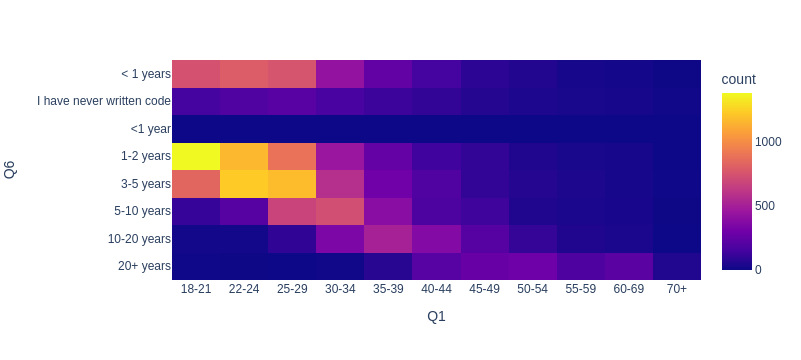

In [12]:
#heatmap for q1 and q6(i,e what their age is and how long have they been coding)
fig = px.density_heatmap(df1, x = 'Q1', y = 'Q6', category_orders = {'Q1':['18-21', '22-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-69', '70+'], 'Q6': ['I have never written code', '<1 year', '1-2 years', '3-5 years', '5-10 years', '10-20 years', '20+ years']})
fig.show()

In [13]:
Questions['Q7']

,Q7_Part_1,Q7_Part_2,Q7_Part_3,Q7_Part_4,Q7_Part_5,Q7_Part_6,Q7_Part_7,Q7_Part_8,Q7_Part_9,Q7_Part_10,Q7_Part_11,Q7_Part_12,Q7_OTHER
1,Python,R,SQL,C,NaN,NaN,Javascript,NaN,NaN,NaN,MATLAB,NaN,Other
2,Python,R,SQL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,Java,Javascript,NaN,NaN,Bash,NaN,NaN,NaN
4,Python,NaN,SQL,NaN,NaN,NaN,NaN,NaN,NaN,Bash,NaN,NaN,NaN
5,Python,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20032,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20033,Python,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20034,Python,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20035,Python,NaN,SQL,C,NaN,Java,Javascript,NaN,NaN,NaN,NaN,NaN,NaN


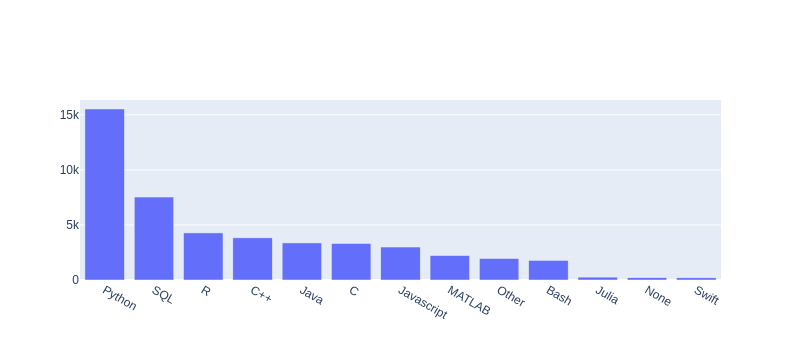

In [14]:
#Q7 example for graph objects use
Questions['Q7'].columns = list(Questions['Q7'].mode().values)#for renaming the columns with the programming language
q7 = Questions['Q7'].count().reset_index()
q7.columns = ['language', 'count']
q7 = q7.sort_values('count', ascending = False)
fig = go.Figure([go.Bar(x= q7['language'], y = q7['count'])])
fig.show()

The main thing i wanted to understand from this analysis was the position by roles. so i used a similar process as above
where the roles are the keys and  dataframes filtered by role are the value pairs. 

In [15]:
Roles = {}
for i in df1.Q5.unique():#for each role in Q5
    Roles[i] = df1[df1.Q5 == i]#assigning roles from question 5 to the Roles dictionary

In [16]:
Roles.keys()

dict_keys(['Student', 'Data Engineer', 'Software Engineer', 'Data Scientist', 'Data Analyst', 'Research Scientist', 'Other', 'Currently not employed', 'Statistician', 'Product/Project Manager', 'Machine Learning Engineer', nan, 'Business Analyst', 'DBA/Database Engineer'])

In [17]:
Roles['Student'] 

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,...,Q35_B_Part_2,Q35_B_Part_3,Q35_B_Part_4,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,TensorBoard,NaN,NaN,NaN,NaN,NaN,NaN
7,748,22-24,Man,Brazil,Bachelor’s degree,Student,3-5 years,Python,R,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,171196,25-29,Woman,China,Master’s degree,Student,< 1 years,NaN,R,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,150,22-24,Man,China,No formal education past high school,Student,< 1 years,Python,NaN,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,7469,18-21,Man,India,Bachelor’s degree,Student,1-2 years,Python,R,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20017,374,18-21,Prefer not to say,China,Bachelor’s degree,Student,1-2 years,Python,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20021,238,18-21,Woman,United States of America,Bachelor’s degree,Student,3-5 years,Python,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20024,221,18-21,Man,India,Bachelor’s degree,Student,3-5 years,Python,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20026,1158,22-24,Man,United States of America,Master’s degree,Student,1-2 years,Python,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
#first subquestion - how does education level vary by role

In [19]:
#all education graph
edu = df1.Q4.value_counts()
edu

Master’s degree                                                      7859
Bachelor’s degree                                                    6978
Doctoral degree                                                      2302
Some college/university study without earning a bachelor’s degree    1092
Professional degree                                                   699
I prefer not to answer                                                399
No formal education past high school                                  240
Name: Q4, dtype: int64

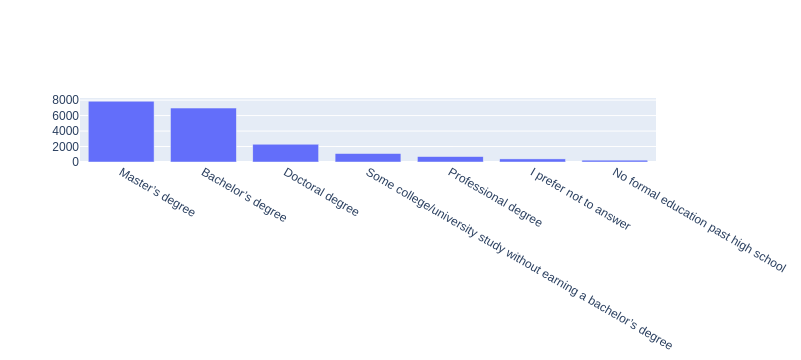

In [20]:
#education across whole sample
fig = go.Figure([go.Bar(x=edu.index, y =edu.values)])
fig.show()

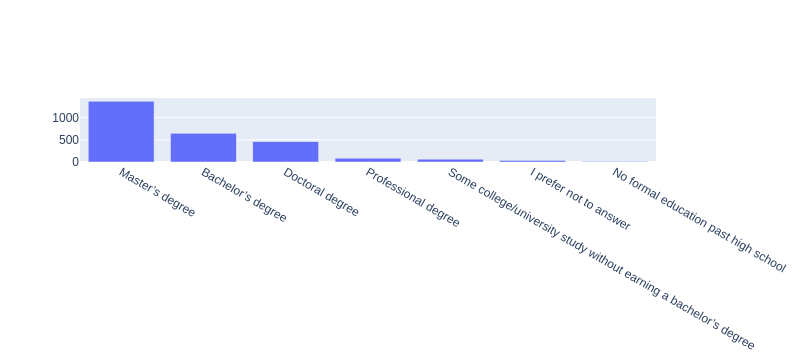

In [21]:
#education for just data scientists
ds_edu = Roles['Data Scientist'].Q4.value_counts()
fig = go.Figure([go.Bar(x=ds_edu.index, y =ds_edu.values)])
fig.show()

Attempting to quantify the gender differences 
i,e how much gender inequality is there in the field of data science and how does this impact earning potential.

here we:
1.first perform some EDA and normalize gender differneces in the sample
2.run a multiple linear regression model to understand which factors contribute most to earning potential
3.run a lasso regression model to narrow variable set and quantify the extent the gender impacts earning potential
4.run a random forest on the same data to check feature importance(a non linear model like this is a good check)

In [22]:
#creating a dictionary for gender selections
Genders = {}
for i in df1.Q2.unique():#for each Gender in Q2
    Genders[i] = df1[df1.Q2 == i]#assigning Genders from question 2 to the Genders dictionary
Genders['Man']

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,...,Q35_B_Part_2,Q35_B_Part_3,Q35_B_Part_4,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER
1,1838,35-39,Man,Colombia,Doctoral degree,Student,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,TensorBoard,NaN,NaN,NaN,NaN,NaN,NaN
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,NaN,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,78,30-34,Man,Japan,Master’s degree,Software Engineer,3-5 years,Python,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20031,922,18-21,Man,India,Master’s degree,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20032,126,18-21,Man,Turkey,Some college/university study without earning ...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20034,238,30-34,Man,Brazil,Master’s degree,Research Scientist,< 1 years,Python,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20035,625,22-24,Man,India,Bachelor’s degree,Software Engineer,3-5 years,Python,NaN,SQL,...,Weights & Biases,NaN,NaN,TensorBoard,NaN,NaN,Trains,NaN,NaN,NaN


In [23]:
#gender distribution
df1.Q2.value_counts()/df1.Q2.value_counts().sum()

Man                        0.788032
Woman                      0.193552
Prefer not to say          0.013126
Prefer to self-describe    0.002695
Nonbinary                  0.002595
Name: Q2, dtype: float64

In [24]:
#filter dataframe for only man and woman 
df_mf = df1[df1.Q2.isin(['Man', 'Woman'])]

In [25]:
#now gender distribbution for new dataframe that has only man and woman
df_mf.Q2.value_counts()/df_mf.Q2.value_counts().sum()
#data science is a male dominant field!


Man      0.802817
Woman    0.197183
Name: Q2, dtype: float64

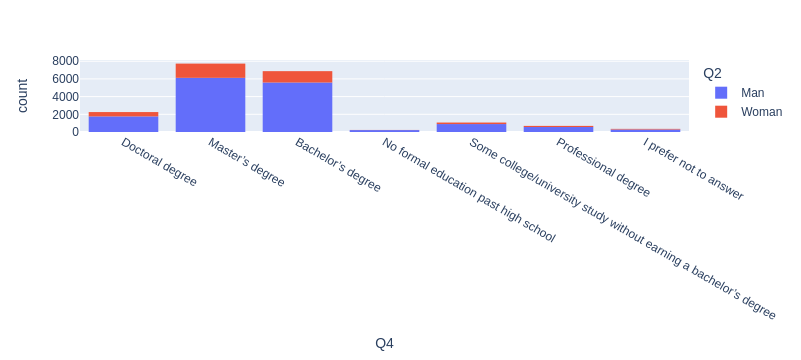

In [26]:
#female distribution by role
fig = px.histogram(df_mf, x = 'Q4', color = 'Q2')
fig.show()

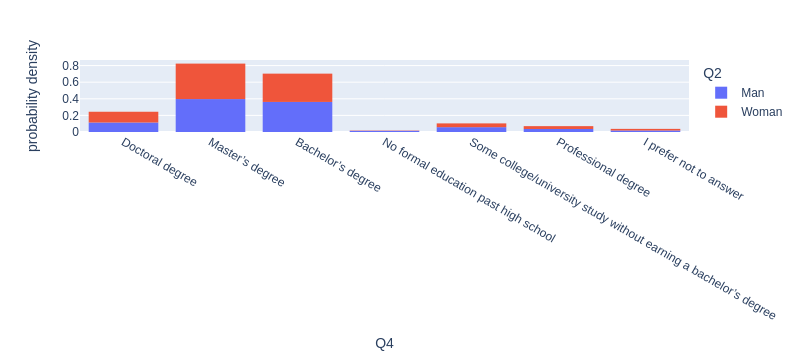

In [27]:
#normalizing it (percents)
fig = px.histogram(df_mf, x = 'Q4', color = 'Q2', histnorm = 'probability density')
fig.show()
#now you get percents instead of the actual number , this gives us a better look

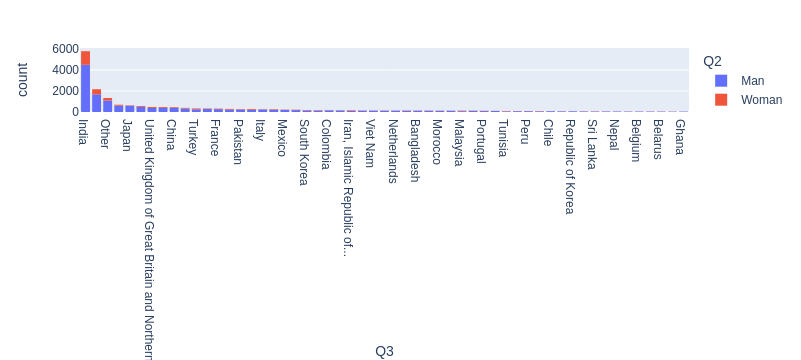

In [28]:
#female distribution by country
fig = px.histogram(df_mf, x = 'Q3', color = 'Q2')
fig.update_xaxes(categoryorder = 'total descending')
fig.show() 

In [29]:
#creating a function for norm graph
def create_norm_graph(qnum, data, title , baseline):
    male = data[data.Q2 == 'Man'][qnum].value_counts()
    female = data[data.Q2 == 'Woman'][qnum].value_counts()
    total = data[qnum].value_counts()
    more_women = (female/total)-baseline #greater proportion of women than sample
    more_women['Color'] = np.where(more_women.values <0, 'blue', 'red')
    fig = go.Figure(go.Bar(x=(female/total).index, y=(female/total).values-baseline, marker_color=more_women.Color))
    fig.update_layout(title= title)
    fig.update_layout(xaxis={'categoryorder':'total descending'})
    fig.show()
    return
#now just created a function that'll help us not to write the same code(i dont understand it fully) again and again. just use this function

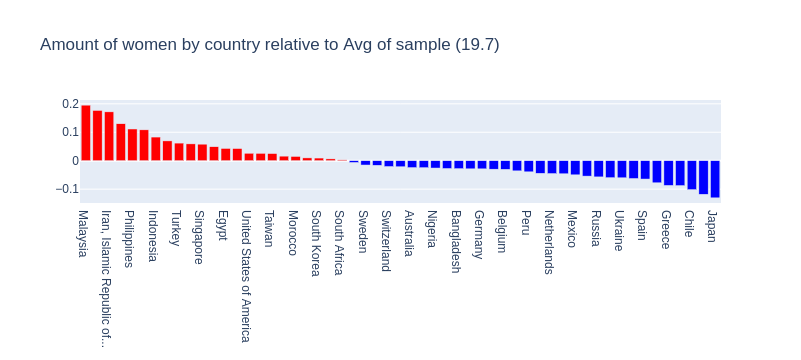

In [30]:
#which countries have the most relative female representatives in the survey?
create_norm_graph('Q3', df_mf, 'Amount of women by country relative to Avg of sample (19.7)', .197)


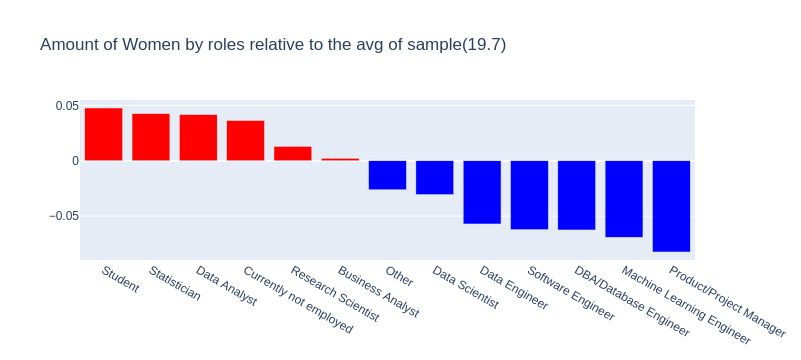

In [31]:
#which roles have a lot of women relative to the baseline
create_norm_graph('Q5', df_mf, 'Amount of Women by roles relative to the avg of sample(19.7)', .197)

In [32]:
#create new base line for employed people(because our goal is to evaluate salary so it makes sense to remove non paying roles) 
df_workers_mf = df_mf[~df_mf['Q5'].isin(['Student', 'Currently not employed'])]#  '~' operator returns the one's compliment of numbers binary.
df_workers_mf.Q2.value_counts()/df_workers_mf.Q2.value_counts().sum()

Man      0.825956
Woman    0.174044
Name: Q2, dtype: float64

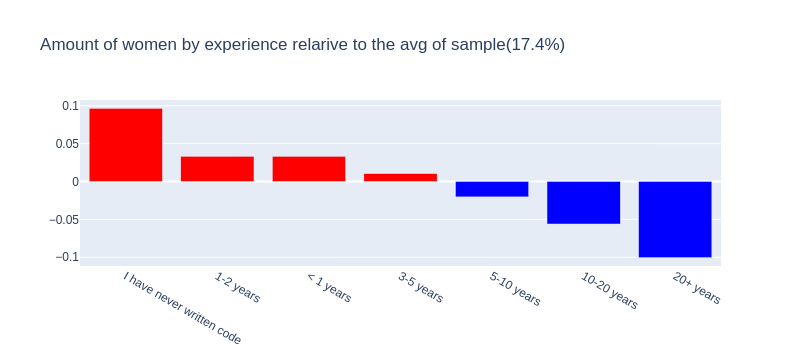

3-5 years                    2793
1-2 years                    2229
5-10 years                   2063
10-20 years                  1587
< 1 years                    1578
20+ years                    1227
I have never written code     654
Name: Q6, dtype: int64

In [33]:
#womens experience in writing code/programming
create_norm_graph('Q6', df_workers_mf, 'Amount of women by experience relarive to the avg of sample(17.4%)', .174)

#absolute number is a lot lower 
df_workers_mf.Q6.value_counts()

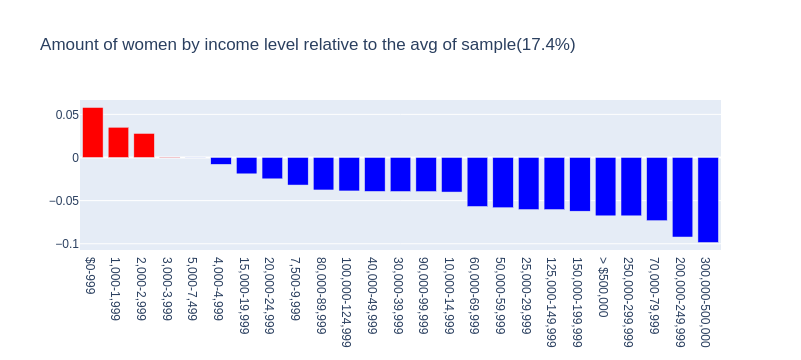

$0-999             2091
10,000-14,999       657
1,000-1,999         574
100,000-124,999     562
40,000-49,999       542
30,000-39,999       535
50,000-59,999       501
5,000-7,499         483
15,000-19,999       445
20,000-24,999       402
60,000-69,999       401
70,000-79,999       387
7,500-9,999         366
150,000-199,999     340
2,000-2,999         322
25,000-29,999       308
125,000-149,999     308
4,000-4,999         277
90,000-99,999       275
80,000-89,999       264
3,000-3,999         258
200,000-249,999     110
300,000-500,000      53
250,000-299,999      47
> $500,000           47
Name: Q24, dtype: int64

In [37]:
#by income level
create_norm_graph('Q24', df_workers_mf, 'Amount of women by income level relative to the avg of sample(17.4%)', .174)
df_workers_mf.Q24.value_counts()

###Building a model
Using a regression model here to predict salary.
And converting the salaries from categorical to numeric, This will allow us to more easily interpret data.

In [35]:
#convert dollar ranges to numeric 
#explore converting other continous variables 
#build model with just gender

In [39]:
#replacing '$' ',' '>' in data
df_model = df1.dropna(subset=['Q24'])
df_model['salary_cleaned'] = df_model.Q24.apply(lambda x : str(x).replace('$', '').replace(',', '').replace('>', '').strip())
df_model.salary_cleaned.value_counts()

/tmp/ipykernel_10291/2565511068.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0-999            2128
10000-14999       665
1000-1999         581
100000-124999     573
40000-49999       552
30000-39999       540
50000-59999       510
5000-7499         488
15000-19999       449
60000-69999       408
20000-24999       404
70000-79999       394
7500-9999         371
150000-199999     347
2000-2999         330
125000-149999     315
25000-29999       310
90000-99999       280
4000-4999         279
80000-89999       273
3000-3999         264
200000-249999     115
300000-500000      55
500000             50
250000-299999      48
Name: salary_cleaned, dtype: int64

In [40]:
#creating new columns for min and max salary
df_model['salary_min'] = df_model.salary_cleaned.apply(lambda x: 500000 if '-' not in x else int(x.split('-')[0]))
df_model['salary_max'] = df_model.salary_cleaned.apply(lambda x: 500000 if '-' not in x else int(x.split('-')[1]))
df_model

/tmp/ipykernel_10291/1718002332.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_10291/1718002332.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,...,Q35_B_Part_5,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER,salary_cleaned,salary_min,salary_max
2,289287,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100000-124999,100000,124999
3,860,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,None,NaN,15000-19999,15000,19999
4,507,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,NaN,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,125000-149999,125000,149999
9,762,35-39,Man,Germany,Doctoral degree,Data Scientist,5-10 years,Python,NaN,SQL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70000-79999,70000,79999
12,742,35-39,Man,United States of America,Doctoral degree,Research Scientist,1-2 years,NaN,R,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30000-39999,30000,39999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20025,2104,35-39,Man,Malaysia,I prefer not to answer,Machine Learning Engineer,1-2 years,Python,NaN,NaN,...,TensorBoard,NaN,NaN,Trains,NaN,NaN,NaN,2000-2999,2000,2999
20030,5461,35-39,Man,Thailand,Bachelor’s degree,Other,10-20 years,NaN,NaN,SQL,...,NaN,NaN,NaN,NaN,NaN,None,NaN,15000-19999,15000,19999
20034,238,30-34,Man,Brazil,Master’s degree,Research Scientist,< 1 years,Python,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0-999,0,999
20035,625,22-24,Man,India,Bachelor’s degree,Software Engineer,3-5 years,Python,NaN,SQL,...,TensorBoard,NaN,NaN,Trains,NaN,NaN,NaN,0-999,0,999


In [41]:
#avergae salary
df_model['approx_salary'] = (df_model.salary_min+df_model.salary_max)/2
df_model.approx_salary.value_counts()

/tmp/ipykernel_10291/2058032536.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



499.5       2128
12499.5      665
1499.5       581
112499.5     573
44999.5      552
34999.5      540
54999.5      510
6249.5       488
17499.5      449
64999.5      408
22499.5      404
74999.5      394
8749.5       371
174999.5     347
2499.5       330
137499.5     315
27499.5      310
94999.5      280
4499.5       279
84999.5      273
3499.5       264
224999.5     115
400000.0      55
500000.0      50
274999.5      48
Name: approx_salary, dtype: int64

In [47]:
#simple linear regression, using statsmodels
import statsmodels.api as sm

In [49]:
#filter the dataset just for men and women 
df_model_fin = df_model[df_model.Q2.isin(['Man', 'Woman'])]
df_model_fin.Q2.head(45)
#filter for workers only
df_model_fin = df_model_fin[~df_model_fin.Q5.isin(['Student', 'Currently not employed'])]
#remove the time from start to finish column(useless)
df_model_fin.drop('Time from Start to Finish (seconds)', axis = 1, inplace = True)
df_model_fin

,Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,Q7_Part_4,...,Q35_B_Part_6,Q35_B_Part_7,Q35_B_Part_8,Q35_B_Part_9,Q35_B_Part_10,Q35_B_OTHER,salary_cleaned,salary_min,salary_max,approx_salary
2,30-34,Man,United States of America,Master’s degree,Data Engineer,5-10 years,Python,R,SQL,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,100000-124999,100000,124999,112499.5
3,35-39,Man,Argentina,Bachelor’s degree,Software Engineer,10-20 years,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,None,NaN,15000-19999,15000,19999,17499.5
4,30-34,Man,United States of America,Master’s degree,Data Scientist,5-10 years,Python,NaN,SQL,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,125000-149999,125000,149999,137499.5
9,35-39,Man,Germany,Doctoral degree,Data Scientist,5-10 years,Python,NaN,SQL,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,70000-79999,70000,79999,74999.5
12,35-39,Man,United States of America,Doctoral degree,Research Scientist,1-2 years,NaN,R,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,30000-39999,30000,39999,34999.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20025,35-39,Man,Malaysia,I prefer not to answer,Machine Learning Engineer,1-2 years,Python,NaN,NaN,NaN,...,NaN,NaN,Trains,NaN,NaN,NaN,2000-2999,2000,2999,2499.5
20030,35-39,Man,Thailand,Bachelor’s degree,Other,10-20 years,NaN,NaN,SQL,C,...,NaN,NaN,NaN,NaN,None,NaN,15000-19999,15000,19999,17499.5
20034,30-34,Man,Brazil,Master’s degree,Research Scientist,< 1 years,Python,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0-999,0,999,499.5
20035,22-24,Man,India,Bachelor’s degree,Software Engineer,3-5 years,Python,NaN,SQL,C,...,NaN,NaN,Trains,NaN,NaN,NaN,0-999,0,999,499.5


In [50]:
#check if there is any null data(even if there is its not gonna matter as we'll create dummy variables)\
df_model_fin.isnull().any()# .any() checks whether any value in the caller object (Dataframe or series) is not 0 and returns True for that. If all values are 0, it will return False.

Q1                False
Q2                False
Q3                False
Q4                False
Q5                False
Q6                False
Q7_Part_1          True
Q7_Part_2          True
Q7_Part_3          True
Q7_Part_4          True
Q7_Part_5          True
Q7_Part_6          True
Q7_Part_7          True
Q7_Part_8          True
Q7_Part_9          True
Q7_Part_10         True
Q7_Part_11         True
Q7_Part_12         True
Q7_OTHER           True
Q8                 True
Q9_Part_1          True
Q9_Part_2          True
Q9_Part_3          True
Q9_Part_4          True
Q9_Part_5          True
Q9_Part_6          True
Q9_Part_7          True
Q9_Part_8          True
Q9_Part_9          True
Q9_Part_10         True
Q9_Part_11         True
Q9_OTHER           True
Q10_Part_1         True
Q10_Part_2         True
Q10_Part_3         True
Q10_Part_4         True
Q10_Part_5         True
Q10_Part_6         True
Q10_Part_7         True
Q10_Part_8         True
Q10_Part_9         True
Q10_Part_10     

In [51]:
#create dummy variables, this is needed because almost all of our data is categorical
model_dummies = pd.get_dummies(df_model_fin)
model_dummies

,salary_min,salary_max,approx_salary,Q1_18-21,Q1_22-24,Q1_25-29,Q1_30-34,Q1_35-39,Q1_40-44,Q1_45-49,...,salary_cleaned_4000-4999,salary_cleaned_40000-49999,salary_cleaned_5000-7499,salary_cleaned_50000-59999,salary_cleaned_500000,salary_cleaned_60000-69999,salary_cleaned_70000-79999,salary_cleaned_7500-9999,salary_cleaned_80000-89999,salary_cleaned_90000-99999
2,100000,124999,112499.5,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,15000,19999,17499.5,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,125000,149999,137499.5,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,70000,79999,74999.5,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
12,30000,39999,34999.5,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20025,2000,2999,2499.5,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
20030,15000,19999,17499.5,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
20034,0,999,499.5,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20035,0,999,499.5,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [52]:
#assigning x and y, we only need one gender in this case because we trimmed it to have only 2 genders , so if its a 0 in man then we know its a 1 in woman
y= model_dummies.approx_salary
X= model_dummies.Q2_Man
X

2        1
3        1
4        1
9        1
12       1
        ..
20025    1
20030    1
20034    1
20035    1
20036    1
Name: Q2_Man, Length: 10555, dtype: uint8

In [53]:
#for statsmodels we need to add a constant to get an intercept (y = bx+c) c is the consant,  here we put X as constant and its basically a column of all 1's
X = sm.add_constant(X)

In [54]:
#fit the model with data 
model = sm.OLS(y,X)
result = model.fit()

In [55]:
#creating a summary report
result.summary()# i dont understand this yet, but according to this report men are expected to make 46,0000$ more than woman(idk how we got that)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          approx_salary   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     59.46
Date:                Tue, 19 Sep 2023   Prob (F-statistic):           1.36e-14
Time:                        22:43:26   Log-Likelihood:            -1.3189e+05
No. Observations:               10555   AIC:                         2.638e+05
Df Residuals:                   10553   BIC:                         2.638e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       3.304e+04   1575.937     20.967      0.000       3e+04    3.61e+04
Q2_Man      1.326e+04   1718.927      7.711      0.000    9885.702    1.66e+04
==============================================================================
Omnibus:                     7193.154   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           111688.022
Skew:                           3.122   Prob(JB):                         0.00
Kurtosis:                      17.662   Cond. No.                         4.82
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [57]:
#creating a function which creates a dataframe with the questions of our choice
def qnums(question_list, dataframe):
    q_out = []
    for i in question_list:
        for j in dataframe.columns:
            if i == j.split('_')[0]:
                q_out.append(j)
    return dataframe.loc[:,q_out]

#create data fro question 2,4,5
q245 = qnums(['Q2', 'Q4', 'Q5'], model_dummies)
q245

,Q2_Man,Q2_Woman,Q4_Bachelor’s degree,Q4_Doctoral degree,Q4_I prefer not to answer,Q4_Master’s degree,Q4_No formal education past high school,Q4_Professional degree,Q4_Some college/university study without earning a bachelor’s degree,Q5_Business Analyst,Q5_DBA/Database Engineer,Q5_Data Analyst,Q5_Data Engineer,Q5_Data Scientist,Q5_Machine Learning Engineer,Q5_Other,Q5_Product/Project Manager,Q5_Research Scientist,Q5_Software Engineer,Q5_Statistician
2,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
9,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
12,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20025,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
20030,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
20034,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
20035,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [58]:
#drop one of the gender columns, its not useful
X = q245.drop('Q2_Man', axis = 1)
X = sm.add_constant(X)

In [60]:
#now we'll build the model with additional data like gender, education and role
model = sm.OLS(y,X)
results = model.fit()
results.summary()

#for a woman its a 13 thousand dollar decrease

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          approx_salary   R-squared:                       0.049
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     31.66
Date:                Tue, 19 Sep 2023   Prob (F-statistic):          9.14e-101
Time:                        22:48:07   Log-Likelihood:            -1.3166e+05
No. Observations:               10555   AIC:                         2.634e+05
Df Residuals:                   10537   BIC:                         2.635e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
const                                                                  6.95e+16   1.88e+17      0.370      0.711   -2.99e+17    4.38e+17
Q2_Woman                                                             -1.302e+04   1704.218     -7.640      0.000   -1.64e+04   -9679.822
Q4_Bachelor’s degree                                                  1.162e+17   1.34e+17      0.866      0.387   -1.47e+17    3.79e+17
Q4_Doctoral degree                                                    1.162e+17   1.34e+17      0.866      0.387   -1.47e+17    3.79e+17
Q4_I prefer not to answer                                             1.162e+17   1.34e+17      0.866      0.387   -1.47e+17    3.79e+17
Q4_Master’s degree                                                    1.162e+17   1.34e+17      0.866      0.387   -1.47e+17    3.79e+17
Q4_No formal education past high school                               1.162e+17   1.34e+17      0.866      0.387   -1.47e+17    3.79e+17
Q4_Professional degree                                                1.162e+17   1.34e+17      0.866      0.387   -1.47e+17    3.79e+17
Q4_Some college/university study without earning a bachelor’s degree  1.162e+17   1.34e+17      0.866      0.387   -1.47e+17    3.79e+17
Q5_Business Analyst                                                  -1.857e+17   1.16e+17     -1.606      0.108   -4.12e+17    4.09e+16
Q5_DBA/Database Engineer                                             -1.857e+17   1.16e+17     -1.606      0.108   -4.12e+17    4.09e+16
Q5_Data Analyst                                                      -1.857e+17   1.16e+17     -1.606      0.108   -4.12e+17    4.09e+16
Q5_Data Engineer                                                     -1.857e+17   1.16e+17     -1.606      0.108   -4.12e+17    4.09e+16
Q5_Data Scientist                                                    -1.857e+17   1.16e+17     -1.606      0.108   -4.12e+17    4.09e+16
Q5_Machine Learning Engineer                                         -1.857e+17   1.16e+17     -1.606      0.108   -4.12e+17    4.09e+16
Q5_Other                                                             -1.857e+17   1.16e+17     -1.606      0.108   -4.12e+17    4.09e+16
Q5_Product/Project Manager                                           -1.857e+17   1.16e+17     -1.606      0.108   -4.12e+17    4.09e+16
Q5_Research Scientist                                                -1.857e+17   1.16e+17     -1.606      0.108   -4.12e+17    4.09e+16
Q5_Software Engineer                                                 -1.857e+17   1.16e+17     -1.606      0.108   -4.12e+17    4.09e+16
Q5_Statistician                                                      

In [61]:
#add in question 7(programming languages)
q2457 = qnums(['Q2', 'Q4', 'Q5', 'Q7'], model_dummies)
q2457

,Q2_Man,Q2_Woman,Q4_Bachelor’s degree,Q4_Doctoral degree,Q4_I prefer not to answer,Q4_Master’s degree,Q4_No formal education past high school,Q4_Professional degree,Q4_Some college/university study without earning a bachelor’s degree,Q5_Business Analyst,...,Q7_Part_4_C,Q7_Part_5_C++,Q7_Part_6_Java,Q7_Part_7_Javascript,Q7_Part_8_Julia,Q7_Part_9_Swift,Q7_Part_10_Bash,Q7_Part_11_MATLAB,Q7_Part_12_None,Q7_OTHER_Other
2,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,1,0,0,0,0,0,0,0,...,0,0,1,1,0,0,1,0,0,0
4,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
12,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20025,1,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
20030,1,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
20034,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20035,1,0,1,0,0,0,0,0,0,0,...,1,0,1,1,0,0,0,0,0,0


In [62]:
X = q2457
X = sm.add_constant(X)

In [63]:
model = sm.OLS(y,X)
results = model.fit()
results.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          approx_salary   R-squared:                       0.084
Model:                            OLS   Adj. R-squared:                  0.082
Method:                 Least Squares   F-statistic:                     32.23
Date:                Tue, 19 Sep 2023   Prob (F-statistic):          1.75e-175
Time:                        22:48:15   Log-Likelihood:            -1.3146e+05
No. Observations:               10555   AIC:                         2.630e+05
Df Residuals:                   10524   BIC:                         2.632e+05
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
const                                                                 4.381e+13   2.19e+16      0.002      0.998   -4.28e+16    4.29e+16
Q2_Man                                                                2.242e+13   1.12e+16      0.002      0.998   -2.19e+16     2.2e+16
Q2_Woman                                                              2.242e+13   1.12e+16      0.002      0.998   -2.19e+16     2.2e+16
Q4_Bachelor’s degree                                                 -2.325e+11   1.16e+14     -0.002      0.998   -2.28e+14    2.27e+14
Q4_Doctoral degree                                                   -2.325e+11   1.16e+14     -0.002      0.998   -2.28e+14    2.27e+14
Q4_I prefer not to answer                                            -2.325e+11   1.16e+14     -0.002      0.998   -2.28e+14    2.27e+14
Q4_Master’s degree                                                   -2.325e+11   1.16e+14     -0.002      0.998   -2.28e+14    2.27e+14
Q4_No formal education past high school                              -2.325e+11   1.16e+14     -0.002      0.998   -2.28e+14    2.27e+14
Q4_Professional degree                                               -2.325e+11   1.16e+14     -0.002      0.998   -2.28e+14    2.27e+14
Q4_Some college/university study without earning a bachelor’s degree -2.325e+11   1.16e+14     -0.002      0.998   -2.28e+14    2.27e+14
Q5_Business Analyst                                                    -6.6e+13    3.3e+16     -0.002      0.998   -6.47e+16    6.45e+16
Q5_DBA/Database Engineer                                               -6.6e+13    3.3e+16     -0.002      0.998   -6.47e+16    6.45e+16
Q5_Data Analyst                                                        -6.6e+13    3.3e+16     -0.002      0.998   -6.47e+16    6.45e+16
Q5_Data Engineer                                                       -6.6e+13    3.3e+16     -0.002      0.998   -6.47e+16    6.45e+16
Q5_Data Scientist                                                      -6.6e+13    3.3e+16     -0.002      0.998   -6.47e+16    6.45e+16
Q5_Machine Learning Engineer                                           -6.6e+13    3.3e+16     -0.002      0.998   -6.47e+16    6.45e+16
Q5_Other                                                               -6.6e+13    3.3e+16     -0.002      0.998   -6.47e+16    6.45e+16
Q5_Product/Project Manager                                             -6.6e+13    3.3e+16     -0.002      0.998   -6.47e+16    6.45e+16
Q5_Research Scientist                                                  -6.6e+13    3.3e+16     -0.002      0.998   -6.47e+16    6.45e+16
Q5_Software Engineer                                                 

In [64]:
#adding country 
q24573 = qnums(['Q2', 'Q4', 'Q5', 'Q7', 'Q3'], model_dummies).drop('Q2_Man', axis =1)

X = q24573
X = sm.add_constant(X)

model = sm.OLS(y,X)
results = model.fit()
results.summary()

#in countries like US its a 82 thousand dollar pay increase where as in countries like india its a 15k $ pay decrease

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          approx_salary   R-squared:                       0.354
Model:                            OLS   Adj. R-squared:                  0.349
Method:                 Least Squares   F-statistic:                     68.42
Date:                Tue, 19 Sep 2023   Prob (F-statistic):               0.00
Time:                        22:48:19   Log-Likelihood:            -1.2961e+05
No. Observations:               10555   AIC:                         2.594e+05
Df Residuals:                   10470   BIC:                         2.600e+05
Df Model:                          84                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
const                                                                  2.51e+04   1472.516     17.044      0.000    2.22e+04     2.8e+04
Q2_Woman                                                             -1.323e+04   1423.693     -9.296      0.000    -1.6e+04   -1.04e+04
Q4_Bachelor’s degree                                                   188.7221   1356.923      0.139      0.889   -2471.106    2848.550
Q4_Doctoral degree                                                     1.76e+04   1636.426     10.755      0.000    1.44e+04    2.08e+04
Q4_I prefer not to answer                                            -1843.3485   3912.540     -0.471      0.638   -9512.673    5825.976
Q4_Master’s degree                                                    6557.8465   1231.695      5.324      0.000    4143.489    8972.204
Q4_No formal education past high school                              -4600.0384   4552.592     -1.010      0.312   -1.35e+04    4323.909
Q4_Professional degree                                                1.086e+04   2356.966      4.607      0.000    6238.101    1.55e+04
Q4_Some college/university study without earning a bachelor’s degree -3663.0187   2568.194     -1.426      0.154   -8697.169    1371.132
Q5_Business Analyst                                                   1770.1236   1997.780      0.886      0.376   -2145.907    5686.154
Q5_DBA/Database Engineer                                              1604.5052   4724.064      0.340      0.734   -7655.562    1.09e+04
Q5_Data Analyst                                                      -8054.8787   1555.671     -5.178      0.000   -1.11e+04   -5005.467
Q5_Data Engineer                                                      2923.8020   2629.507      1.112      0.266   -2230.533    8078.137
Q5_Data Scientist                                                     7926.7121   1259.497      6.294      0.000    5457.859    1.04e+04
Q5_Machine Learning Engineer                                          3846.1070   1799.602      2.137      0.033     318.543    7373.671
Q5_Other                                                              3195.7638   1441.442      2.217      0.027     370.262    6021.266
Q5_Product/Project Manager                                             1.74e+04   2119.480      8.211      0.000    1.32e+04    2.16e+04
Q5_Research Scientist                                                -3791.7584   1838.671     -2.062      0.039   -7395.905    -187.612
Q5_Software Engineer                                                  1556.6367   1525.376      1.020      0.308   -1433.392    4546.665
Q5_Statistician                                                      

In [65]:
#lasso regression
q245736 = qnums(['Q2', 'Q4', 'Q5', 'Q7', 'Q3', 'Q6'], model_dummies).drop('Q2_Man', axis =1)
X = q245736
X = sm.add_constant(X)

In [66]:
model2 = sm.OLS(y,X)
results = model2.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          approx_salary   R-squared:                       0.381
Model:                            OLS   Adj. R-squared:                  0.375
Method:                 Least Squares   F-statistic:                     71.42
Date:                Tue, 19 Sep 2023   Prob (F-statistic):               0.00
Time:                        22:55:57   Log-Likelihood:            -1.2939e+05
No. Observations:               10555   AIC:                         2.590e+05
Df Residuals:                   10464   BIC:                         2.596e+05
Df Model:                          90                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
const                                                                -9.949e+15   6.07e+16     -0.164      0.870   -1.29e+17    1.09e+17
Q2_Woman                                                             -1.034e+04   1402.659     -7.372      0.000   -1.31e+04   -7590.721
Q4_Bachelor’s degree                                                  1.566e+16   9.55e+16      0.164      0.870   -1.72e+17    2.03e+17
Q4_Doctoral degree                                                    1.566e+16   9.55e+16      0.164      0.870   -1.72e+17    2.03e+17
Q4_I prefer not to answer                                             1.566e+16   9.55e+16      0.164      0.870   -1.72e+17    2.03e+17
Q4_Master’s degree                                                    1.566e+16   9.55e+16      0.164      0.870   -1.72e+17    2.03e+17
Q4_No formal education past high school                               1.566e+16   9.55e+16      0.164      0.870   -1.72e+17    2.03e+17
Q4_Professional degree                                                1.566e+16   9.55e+16      0.164      0.870   -1.72e+17    2.03e+17
Q4_Some college/university study without earning a bachelor’s degree  1.566e+16   9.55e+16      0.164      0.870   -1.72e+17    2.03e+17
Q5_Business Analyst                                                   1.494e+15   9.11e+15      0.164      0.870   -1.64e+16    1.94e+16
Q5_DBA/Database Engineer                                              1.494e+15   9.11e+15      0.164      0.870   -1.64e+16    1.94e+16
Q5_Data Analyst                                                       1.494e+15   9.11e+15      0.164      0.870   -1.64e+16    1.94e+16
Q5_Data Engineer                                                      1.494e+15   9.11e+15      0.164      0.870   -1.64e+16    1.94e+16
Q5_Data Scientist                                                     1.494e+15   9.11e+15      0.164      0.870   -1.64e+16    1.94e+16
Q5_Machine Learning Engineer                                          1.494e+15   9.11e+15      0.164      0.870   -1.64e+16    1.94e+16
Q5_Other                                                              1.494e+15   9.11e+15      0.164      0.870   -1.64e+16    1.94e+16
Q5_Product/Project Manager                                            1.494e+15   9.11e+15      0.164      0.870   -1.64e+16    1.94e+16
Q5_Research Scientist                                                 1.494e+15   9.11e+15      0.164      0.870   -1.64e+16    1.94e+16
Q5_Software Engineer                                                  1.494e+15   9.11e+15      0.164      0.870   -1.64e+16    1.94e+16
Q5_Statistician                                                      

In [69]:
#fit the model with lasso parameters set alpha high enough to eliminate some variables
results_reg = model2.fit_regularized(L1_wt = 1, alpha = 5) #so if L1_wt = 0 its a ridge regression , and if its 0.5 then its elastic regression
final = sm.regression.linear_model.OLSResults(model2, results_reg.params, model2.normalized_cov_params)
print(final.summary())

                            OLS Regression Results                            
Dep. Variable:          approx_salary   R-squared:                       0.380
Model:                            OLS   Adj. R-squared:                  0.375
Method:                 Least Squares   F-statistic:                     71.41
Date:                Tue, 19 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:08:33   Log-Likelihood:            -1.2939e+05
No. Observations:               10555   AIC:                         2.590e+05
Df Residuals:                   10464   BIC:                         2.596e+05
Df Model:                          90                                         
Covariance Type:            nonrobust                                         
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

In [70]:
from sklearn.ensemble import RandomForestRegressor

In [71]:
clf_rf = RandomForestRegressor()# clf_rf = classifier_randomforest
clf_rf.fit(X,y)


RandomForestRegressor()

<BarContainer object of 1 artists>

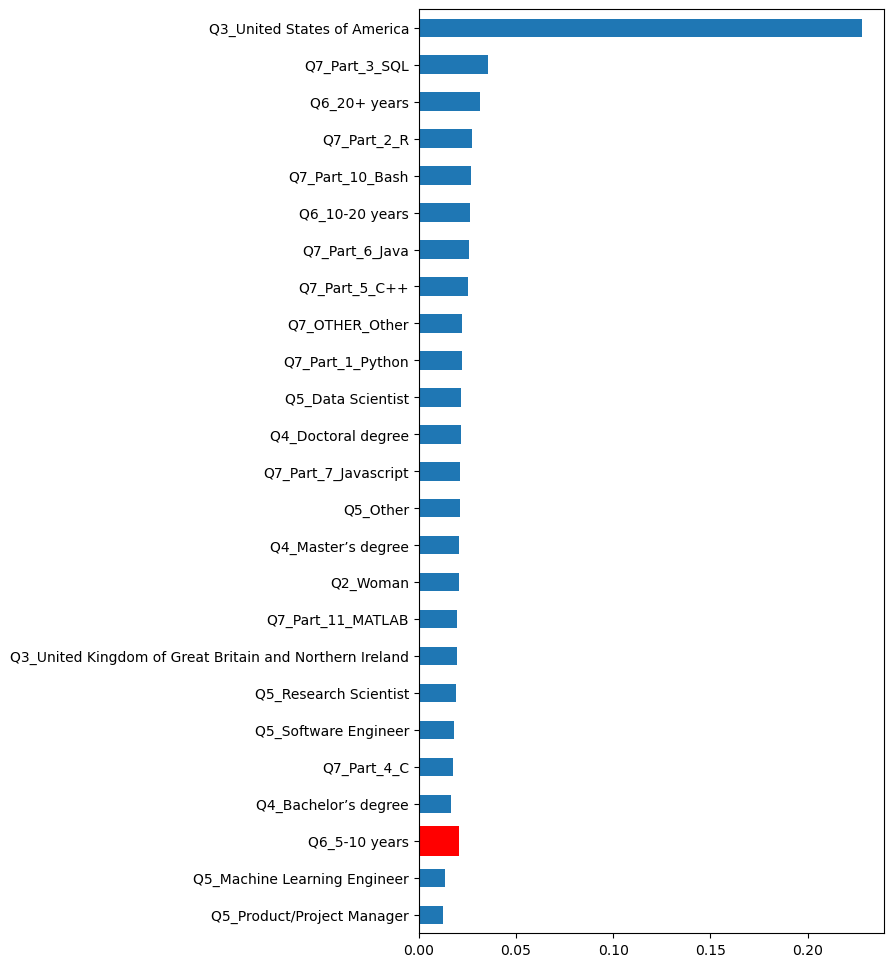

In [84]:
# we'll create a graph which shows which feature is the most important when it comes to salary earning
feat_importances = pd.Series(clf_rf.feature_importances_ , index = X.columns)
ax = feat_importances.nlargest(25).sort_values().plot(kind = 'barh', figsize = (6,12))
ax.barh([2], feat_importances.loc['Q2_Woman'], color = 'red')

In [87]:
#we'll build models for men and women independently. See how they estimate salary on the same data
#This is a decent way to isolate the individual effects of Education , Country , Expereience etc.
Women_Model = model_dummies[model_dummies.Q2_Man == 0]
Men_Model = model_dummies[model_dummies.Q2_Man == 1]

In [89]:
# create and train women's model 
women_fin =  qnums(['Q4','Q5','Q7','Q3','Q6','Q20'], Women_Model)
y_W = Women_Model.approx_salary
X_W = women_fin
X_W = sm.add_constant(X_W)

Women_Model

,salary_min,salary_max,approx_salary,Q1_18-21,Q1_22-24,Q1_25-29,Q1_30-34,Q1_35-39,Q1_40-44,Q1_45-49,...,salary_cleaned_4000-4999,salary_cleaned_40000-49999,salary_cleaned_5000-7499,salary_cleaned_50000-59999,salary_cleaned_500000,salary_cleaned_60000-69999,salary_cleaned_70000-79999,salary_cleaned_7500-9999,salary_cleaned_80000-89999,salary_cleaned_90000-99999
21,1000,1999,1499.5,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
23,125000,149999,137499.5,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31,15000,19999,17499.5,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
35,125000,149999,137499.5,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
45,1000,1999,1499.5,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19972,10000,14999,12499.5,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19983,25000,29999,27499.5,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19998,0,999,499.5,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20008,5000,7499,6249.5,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [91]:
#linear 
model_W = sm.OLS(y_W,X_W)
results_W= model_W.fit()
results_W.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          approx_salary   R-squared:                       0.455
Model:                            OLS   Adj. R-squared:                  0.423
Method:                 Least Squares   F-statistic:                     14.26
Date:                Tue, 19 Sep 2023   Prob (F-statistic):          5.21e-150
Time:                        23:41:49   Log-Likelihood:                -20265.
No. Observations:                1683   AIC:                         4.072e+04
Df Residuals:                    1589   BIC:                         4.123e+04
Df Model:                          93                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
const                                                                 1.988e+04   3101.484      6.408      0.000    1.38e+04     2.6e+04
Q4_Bachelor’s degree                                                   312.1050   3838.996      0.081      0.935   -7217.925    7842.135
Q4_Doctoral degree                                                    1.077e+04   4212.652      2.557      0.011    2507.802     1.9e+04
Q4_I prefer not to answer                                            -2867.7561   8493.081     -0.338      0.736   -1.95e+04    1.38e+04
Q4_Master’s degree                                                    7044.7911   3624.501      1.944      0.052     -64.516    1.42e+04
Q4_No formal education past high school                               1452.1675   1.91e+04      0.076      0.939   -3.61e+04     3.9e+04
Q4_Professional degree                                                8490.3819   5496.860      1.545      0.123   -2291.479    1.93e+04
Q4_Some college/university study without earning a bachelor’s degree -5326.6631   7082.391     -0.752      0.452   -1.92e+04    8565.149
Q5_Business Analyst                                                   6600.1942   3999.762      1.650      0.099   -1245.171    1.44e+04
Q5_DBA/Database Engineer                                             -1.097e+04   1.16e+04     -0.946      0.344   -3.37e+04    1.18e+04
Q5_Data Analyst                                                      -2458.8527   2896.590     -0.849      0.396   -8140.393    3222.687
Q5_Data Engineer                                                      7734.3410   5849.539      1.322      0.186   -3739.284    1.92e+04
Q5_Data Scientist                                                     7798.3946   2745.597      2.840      0.005    2413.022    1.32e+04
Q5_Machine Learning Engineer                                          -813.8835   4312.644     -0.189      0.850   -9272.954    7645.187
Q5_Other                                                             -1752.9455   3060.888     -0.573      0.567   -7756.749    4250.858
Q5_Product/Project Manager                                            1.875e+04   5301.739      3.537      0.000    8352.247    2.92e+04
Q5_Research Scientist                                                -4727.4656   3609.717     -1.310      0.191   -1.18e+04    2352.843
Q5_Software Engineer                                                  1672.1669   3472.141      0.482      0.630   -5138.293    8482.627
Q5_Statistician                                                      -1961.6449   5725.817     -0.343      0.732   -1.32e+04    9269.305
Q7_Part_1_Python                                                     

In [92]:
#lasso 
results_reg_W = model_W.fit_regularized(L1_wt=1, alpha= 5)
final_W = sm.regression.linear_model.OLSResults(model_W,results_reg_W.params,model_W.normalized_cov_params)
print(final_W.summary())

                            OLS Regression Results                            
Dep. Variable:          approx_salary   R-squared:                       0.455
Model:                            OLS   Adj. R-squared:                  0.423
Method:                 Least Squares   F-statistic:                     14.25
Date:                Tue, 19 Sep 2023   Prob (F-statistic):          6.75e-150
Time:                        23:49:45   Log-Likelihood:                -20265.
No. Observations:                1683   AIC:                         4.072e+04
Df Residuals:                    1589   BIC:                         4.123e+04
Df Model:                          93                                         
Covariance Type:            nonrobust                                         
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

In [94]:
#create and train men's model 
men_fin =  qnums(['Q4','Q5','Q7','Q3','Q6','Q20'], Men_Model)
y_M = Men_Model.approx_salary
X_M = men_fin
X_M = sm.add_constant(X_M)

#Linear
model_M = sm.OLS(y_M,X_M)
results_M= model_M.fit()
results_M.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          approx_salary   R-squared:                       0.386
Model:                            OLS   Adj. R-squared:                  0.379
Method:                 Least Squares   F-statistic:                     59.27
Date:                Tue, 19 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:51:36   Log-Likelihood:            -1.0891e+05
No. Observations:                8872   AIC:                         2.180e+05
Df Residuals:                    8778   BIC:                         2.187e+05
Df Model:                          93                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
const                                                                  2.34e+04   1332.468     17.562      0.000    2.08e+04     2.6e+04
Q4_Bachelor’s degree                                                  2448.0793   1475.146      1.660      0.097    -443.552    5339.711
Q4_Doctoral degree                                                    1.054e+04   1811.582      5.820      0.000    6992.302    1.41e+04
Q4_I prefer not to answer                                              129.5852   4241.254      0.031      0.976   -8184.267    8443.437
Q4_Master’s degree                                                    5532.9717   1337.070      4.138      0.000    2912.001    8153.942
Q4_No formal education past high school                              -4552.0372   4630.725     -0.983      0.326   -1.36e+04    4525.269
Q4_Professional degree                                                9127.7562   2559.844      3.566      0.000    4109.862    1.41e+04
Q4_Some college/university study without earning a bachelor’s degree   170.9805   2717.167      0.063      0.950   -5155.304    5497.265
Q5_Business Analyst                                                   3071.4566   2218.820      1.384      0.166   -1277.951    7420.865
Q5_DBA/Database Engineer                                             -3856.8905   5013.052     -0.769      0.442   -1.37e+04    5969.865
Q5_Data Analyst                                                      -4922.3222   1762.367     -2.793      0.005   -8376.974   -1467.670
Q5_Data Engineer                                                      -217.3508   2830.810     -0.077      0.939   -5766.401    5331.700
Q5_Data Scientist                                                     9339.9756   1374.088      6.797      0.000    6646.441     1.2e+04
Q5_Machine Learning Engineer                                          6966.7092   1933.661      3.603      0.000    3176.281    1.08e+04
Q5_Other                                                              5018.8962   1597.769      3.141      0.002    1886.894    8150.898
Q5_Product/Project Manager                                             1.46e+04   2254.054      6.475      0.000    1.02e+04     1.9e+04
Q5_Research Scientist                                                -3442.2226   2039.062     -1.688      0.091   -7439.261     554.816
Q5_Software Engineer                                                 -1843.8724   1656.325     -1.113      0.266   -5090.658    1402.914
Q5_Statistician                                                      -1308.8859   3650.809     -0.359      0.720   -8465.328    5847.556
Q7_Part_1_Python                                                     

In [95]:
#lasso
results_reg_M = model_M.fit_regularized(L1_wt=1, alpha= 5)
final_M = sm.regression.linear_model.OLSResults(model_M,results_reg_M.params,model_M.normalized_cov_params)
print(final_M.summary())

                            OLS Regression Results                            
Dep. Variable:          approx_salary   R-squared:                       0.386
Model:                            OLS   Adj. R-squared:                  0.379
Method:                 Least Squares   F-statistic:                     59.24
Date:                Tue, 19 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:52:49   Log-Likelihood:            -1.0891e+05
No. Observations:                8872   AIC:                         2.180e+05
Df Residuals:                    8778   BIC:                         2.187e+05
Df Model:                          93                                         
Covariance Type:            nonrobust                                         
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

In [100]:
#run model on all data and compare 
combined_data = qnums(['Q4','Q5','Q7','Q3','Q6','Q20'], model_dummies)
male_preds = final_M.predict(np.array(sm.add_constant(combined_data)))
female_preds = final_W.predict(np.array(sm.add_constant(combined_data)))

In [112]:
#add the columns male and female preds in combined data
combined_data['male_preds'] = male_preds
combined_data['female_preds'] = female_preds
combined_data.columns

Index(['Q4_Bachelor’s degree', 'Q4_Doctoral degree',
       'Q4_I prefer not to answer', 'Q4_Master’s degree',
       'Q4_No formal education past high school', 'Q4_Professional degree',
       'Q4_Some college/university study without earning a bachelor’s degree',
       'Q5_Business Analyst', 'Q5_DBA/Database Engineer', 'Q5_Data Analyst',
       'Q5_Data Engineer', 'Q5_Data Scientist', 'Q5_Machine Learning Engineer',
       'Q5_Other', 'Q5_Product/Project Manager', 'Q5_Research Scientist',
       'Q5_Software Engineer', 'Q5_Statistician', 'Q7_Part_1_Python',
       'Q7_Part_2_R', 'Q7_Part_3_SQL', 'Q7_Part_4_C', 'Q7_Part_5_C++',
       'Q7_Part_6_Java', 'Q7_Part_7_Javascript', 'Q7_Part_8_Julia',
       'Q7_Part_9_Swift', 'Q7_Part_10_Bash', 'Q7_Part_11_MATLAB',
       'Q7_Part_12_None', 'Q7_OTHER_Other', 'Q3_Argentina', 'Q3_Australia',
       'Q3_Bangladesh', 'Q3_Belarus', 'Q3_Belgium', 'Q3_Brazil', 'Q3_Canada',
       'Q3_Chile', 'Q3_China', 'Q3_Colombia', 'Q3_Egypt', 'Q3_France',
   

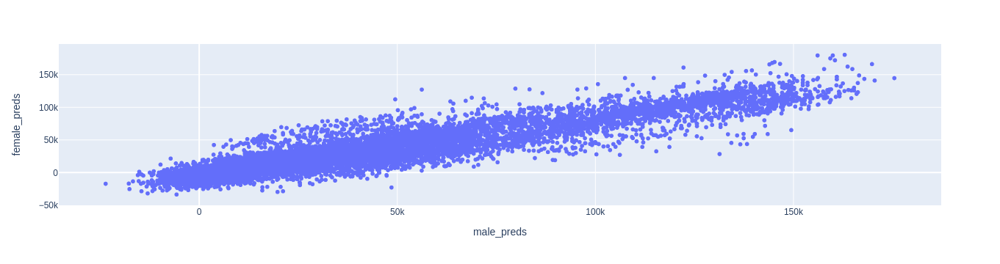

In [104]:
#scatter plot for comparision
px.scatter(combined_data, x = 'male_preds' , y = 'female_preds')

In [114]:
combined_data['approx_salary'] = model_dummies.approx_salary
combined_data

,Q4_Bachelor’s degree,Q4_Doctoral degree,Q4_I prefer not to answer,Q4_Master’s degree,Q4_No formal education past high school,Q4_Professional degree,Q4_Some college/university study without earning a bachelor’s degree,Q5_Business Analyst,Q5_DBA/Database Engineer,Q5_Data Analyst,...,Q6_< 1 years,Q6_I have never written code,Q20_0-49 employees,"Q20_10,000 or more employees","Q20_1000-9,999 employees",Q20_250-999 employees,Q20_50-249 employees,male_preds,female_preds,approx_salary
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,127143.356634,114616.086825,112499.5
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,31497.698891,40234.308524,17499.5
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,135392.860754,122941.431406,137499.5
9,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,94787.401929,86647.133233,74999.5
12,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,93348.869936,79243.232485,34999.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20025,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,8976.886472,-12260.202901,2499.5
20030,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,51560.528298,47912.177541,17499.5
20034,0,0,0,1,0,0,0,0,0,0,...,1,0,1,0,0,0,0,-3176.669102,-11548.907032,499.5
20035,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,16621.926600,11530.652270,499.5


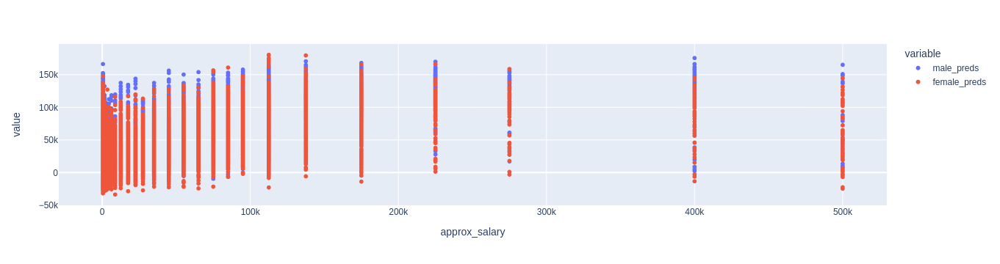

In [116]:
px.scatter(combined_data.sort_values('approx_salary'), x = 'approx_salary', y = ['male_preds','female_preds'])

In [117]:
#difference of male_pred and female_preds
combined_data['projected_diff'] = combined_data.male_preds - combined_data.female_preds

In [119]:
#avg of that
combined_data.projected_diff.mean()
# so on avg the male model is predicting 10,000$ in pay more

10159.498797873399

In [120]:
combined_data.projected_diff.std()

15463.877347487536

In [121]:
#wanted to look how often did the female model predicted more than the male model
combined_data['women_prj_higher'] = combined_data.projected_diff.apply(lambda x: 1 if x < 0 else 0)
combined_data.women_prj_higher.value_counts()
#0 male , 1 female

0    8248
1    2307
Name: women_prj_higher, dtype: int64